<a href="https://colab.research.google.com/github/alarcon7a/gemini_ai_python/blob/main/Gemini_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Gemini Pro (API)

1. Google Dev https://ai.google.dev/
2. Proyecto Gemini : https://deepmind.google/technologies/gemini/
3. Gemini - Python: https://cloud.google.com/vertex-ai/docs/generative-ai/multimodal/sdk-for-gemini/gemini-sdk-overview-reference

https://youtu.be/l59tJpeV0WQ?si=0IqHa5UDgEZ2HR8-

## Instalando algunas librerias

In [1]:
# !pip install -q -U google-generativeai

## Importando librerias

In [1]:
import textwrap

import google.generativeai as genai

# Used to securely store your API key

from IPython.display import display
from IPython.display import Markdown


def to_markdown(text):
    """ 
        Esta función se utiliza para darle "mejor" formato a las salidas obtenidas que tienen formato
        markdown.
        
        Args:
            text () : texto obtenido como salida.

    """
    text = text.replace('•', '  *')
    return Markdown(textwrap.indent(text, '> ', predicate=lambda _: True))

d:\Desarrollo\Proyectos\Gemini_IA_Python\.env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Asignando el API Key

In [2]:
from getpass import getpass
import os

GOOGLE_API_KEY = getpass('Enter the secret value: ')

In [3]:
genai.configure(api_key=GOOGLE_API_KEY)

## Modelos disponibles de Gemini

In [4]:
for m in genai.list_models():
    if 'generateContent' in m.supported_generation_methods:
        print(m.name)

models/gemini-1.5-pro-latest
models/gemini-1.5-pro-002
models/gemini-1.5-pro
models/gemini-1.5-flash-latest
models/gemini-1.5-flash
models/gemini-1.5-flash-002
models/gemini-1.5-flash-8b
models/gemini-1.5-flash-8b-001
models/gemini-1.5-flash-8b-latest
models/gemini-2.5-pro-preview-03-25
models/gemini-2.5-flash-preview-05-20
models/gemini-2.5-flash
models/gemini-2.5-flash-lite-preview-06-17
models/gemini-2.5-pro-preview-05-06
models/gemini-2.5-pro-preview-06-05
models/gemini-2.5-pro
models/gemini-2.0-flash-exp
models/gemini-2.0-flash
models/gemini-2.0-flash-001
models/gemini-2.0-flash-exp-image-generation
models/gemini-2.0-flash-lite-001
models/gemini-2.0-flash-lite
models/gemini-2.0-flash-preview-image-generation
models/gemini-2.0-flash-lite-preview-02-05
models/gemini-2.0-flash-lite-preview
models/gemini-2.0-pro-exp
models/gemini-2.0-pro-exp-02-05
models/gemini-exp-1206
models/gemini-2.0-flash-thinking-exp-01-21
models/gemini-2.0-flash-thinking-exp
models/gemini-2.0-flash-thinking-exp

## Gemini pro

#### Configuracion del LLM

In [5]:
generation_config = {
    "temperature": 0.8,
    "top_p": 1,
    "top_k": 1,
    "max_output_tokens": 2048,
}

In [6]:
# Ver los modelos disponibles para poner el correcto
model = genai.GenerativeModel('gemini-2.5-pro',generation_config=generation_config)

### Inferencia sobre el modelo de texto

In [23]:
%%time
response = model.generate_content("Dame el codigo de un dataframe de pandas para sacar la diferencia de dias entre  fechas de datetime64[ns]")
to_markdown(response.text)

CPU times: total: 93.8 ms
Wall time: 1min 37s


> ¡Claro que sí! Aquí tienes el código y una explicación detallada para calcular la diferencia de días entre dos columnas de fecha en un DataFrame de Pandas.
> 
> ### Método Principal: Resta Directa y el Accesor `.dt`
> 
> La forma más sencilla y "pandástica" de hacerlo es restar directamente las columnas. El resultado será un objeto `Timedelta`, del cual puedes extraer fácilmente el número de días.
> 
> ---
> 
> ### Código de Ejemplo Completo
> 
> ```python
> import pandas as pd
> 
> # 1. Crear un DataFrame de ejemplo
> # Las fechas están como strings, que es un caso de uso muy común.
> data = {
>     'ID_Proyecto': [101, 102, 103, 104],
>     'Fecha_Inicio': ['2023-01-15', '2023-02-20', '2023-03-10', '2023-04-01'],
>     'Fecha_Fin': ['2023-01-31', '2023-03-05',

In [13]:
%%time
response = model.generate_content("Como puedo lograr leer un archivo de tipo csv es Python?")
to_markdown(response.text)

CPU times: total: 156 ms
Wall time: 1min 25s


> ¡Claro que sí! Leer archivos CSV en Python es una tarea muy común y afortunadamente, muy sencilla. Tienes principalmente dos formas excelentes de hacerlo:
> 
> 1.  **Usando el módulo `csv`**: Integrado en Python, no necesitas instalar nada. Es ideal para tareas simples.
> 2.  **Usando la biblioteca `pandas`**: Es la herramienta estándar en el mundo de la ciencia de datos. Es mucho más potente y versátil, especialmente para archivos grandes o para realizar análisis de datos.
> 
> A continuación, te explico ambas con ejemplos.
> 
> ---
> 
> ### Preparación: Nuestro Archivo CSV de Ejemplo
> 
> Imagina que tienes un archivo llamado `datos.csv` en la misma carpeta que tu script de Python. Este es su contenido:
> 
> **`datos.csv`**
> ```csv
> Nombre,Edad,Ciudad
> Ana,28,Madrid
> Luis,34,Barcelona
> Marta,45,Valencia
> Carlos,22,Sevilla
> ```
> 
> ---
> 
> ### Opción 1: Usando el Módulo `csv` (La forma estándar)
> 
> Esta es la manera más directa y no requiere ninguna instalación adicional.
> 
> #### a) Leer el CSV como una lista de listas
> 
> Cada fila del CSV se convierte en una lista de cadenas de texto.
> 
> ```python
> import csv
> 
> # Usamos 'with' para asegurarnos de que el archivo se cierre automáticamente
> with open('datos.csv', mode='r', encoding='utf-8') as archivo:
>     # Creamos un objeto lector de CSV
>     lector_csv = csv.reader(archivo)
> 
>     # Opcional: Omitir la fila de encabezado
>     encabezado = next(lector_csv)
>     print(f"El encabezado es: {encabezado}")
> 
>     # Iteramos sobre cada fila del archivo
>     print("Contenido del archivo:")
>     for fila in lector_csv:
>         # cada 'fila' es una lista de strings
>         print(fila)
>         
>         # Puedes acceder a los datos por su índice
>         nombre = fila[0]
>         edad = int(fila[1]) # Convertimos la edad a número
>         ciudad = fila[2]
>         print(f" -> {nombre} tiene {edad} años y vive en {ciudad}.")
> 
> ```
> 
> **Explicación del código:**
> 1.  **`import csv`**: Importa el módulo necesario.
> 2.  **`with open('datos.csv', mode='r', encoding='utf-8') as archivo:`**: Abre el archivo en modo lectura (`r`). `encoding='utf-8'` es muy importante para manejar correctamente caracteres como `ñ` o tildes.
> 3.  **`csv.reader(archivo)`**: Crea un objeto "lector" que sabe cómo interpretar un archivo CSV.
> 4.  **`next(

In [24]:
%%time
response = model.generate_content("Crea un pequeño cuento en el que He-Man conoce a Skeletor en su intimidad y se asocian para salvar el castillo")
to_markdown(response.text)

CPU times: total: 125 ms
Wall time: 1min 37s


> Claro, aquí tienes un pequeño cuento sobre esa extraña alianza.
> 
> ***
> 
> El eco de sus propias botas era el único sonido que acompañaba a He-Man por los sinuosos y fríos pasillos de la Montaña Serpiente. La Hechicera le había enviado en una misión de sigilo, algo inusual para él. Habían detectado una fluctuación de poder inestable, no proveniente del Báculo de Skeletor, sino de algo más… personal.
> 
> Tras evitar varias trampas y a un Bestia dormido que roncaba como una avalancha, He-Man llegó a una sección de la fortaleza que nunca había visto. En lugar de grandes salones de tronos y laboratorios malignos, eran aposentos más pequeños y privados. De una puerta ligeramente entornada emanaba una luz cálida y un suave tarareo, una melodía sorprendentemente melancólica.
> 
> Con la Espada del Poder en mano, empujó la puerta con cautela. Lo que vio le dejó sin aliento, más que cualquier golpe de sus enemigos.
> 
> Allí estaba Skeletor. No llevaba su armadura de batalla, sino una simple túnica morada, algo raída. Sobre su cráneo huesudo reposaba una boina ladeada. En una mano sostenía una paleta de colores y en la otra, un fino pincel. Frente a él, sobre un caballete, había un lienzo. Y en el lienzo no había una escena de conquista ni destrucción, sino un delicado y hermoso

In [18]:
response = model.generate_content("Cual es el significado de la vida?")
to_markdown(response.text)

> Esa es, quizás, la pregunta más profunda y fundamental que el ser humano se ha hecho a lo largo de la historia. No existe una respuesta única y universalmente aceptada, ya que el "significado" depende enormemente de la perspectiva filosófica, religiosa, cultural y personal de cada individuo.
> 
> En lugar

In [27]:
response = model.generate_content("por que el significado de la vida y el universo es 42", stream=True)
for chunk in response:
    print(chunk.text)
    print("*"*80)

¡Excelente pregunta! La respuesta de que **el significado de la vida, el universo y
********************************************************************************
 todo lo demás es 42** es una de las bromas más famosas de la cultura geek y la ciencia ficción.
********************************************************************************


No es una respuesta filosófica o científica real, sino que proviene de la aclamada saga de libros de com
********************************************************************************
edia y ciencia ficción **"La Guía del Autoestopista Galáctico"** (*The Hitchhiker's Guide
********************************************************************************
 to the Galaxy*), escrita por Douglas Adams.

Aquí te explico el contexto completo de la broma:

###
********************************************************************************
 El Origen en el Libro

1.  **La Pregunta Fundamental:** En la historia, una raza de seres hiper
*******************

## Chat

In [28]:
model = genai.GenerativeModel('gemini-2.5-pro')
chat = model.start_chat(history=[])
chat

ChatSession(
    model=genai.GenerativeModel(
        model_name='models/gemini-2.5-pro',
        generation_config={},
        safety_settings={},
        tools=None,
        system_instruction=None,
        cached_content=None
    ),
    history=[]
)

In [29]:
response = chat.send_message("Hola, quiero saber mas de inteligencia artificial, conoces de openai y gpt4?")
to_markdown(response.text)

> ¡Hola! Claro que sí. Has preguntado por uno de los temas más fascinantes y relevantes de la actualidad. Con mucho gusto te explico de manera clara qué es la inteligencia artificial, qué papel juega OpenAI y qué es exactamente GPT-4.
> 
> Vamos a desglosarlo paso a paso.
> 
> ### 1. ¿Qué es la Inteligencia Artificial (IA)?
> 
> En términos sencillos, la **Inteligencia Artificial** es un campo de la informática que se dedica a crear sistemas o máquinas capaces de realizar tareas que normalmente requieren inteligencia humana.
> 
> Piensa en cosas como:
> *   **Aprender:** Adquirir información y reglas para usarla.
> *   **Razonar:** Usar esas reglas para llegar a conclusiones lógicas.
> *   **Resolver problemas:** Encontrar soluciones a nuevos desafíos.
> *   **Percibir:** Entender el mundo a través de datos (como imágenes, sonidos o texto).
> *   **Crear:** Generar contenido nuevo y original.
> 
> La IA ya está en muchos lugares de nuestra vida diaria: los asistentes de voz como Siri o Alexa, las recomendaciones de series en Netflix, los filtros de spam de tu correo electrónico o las rutas que te sugiere Google Maps.
> 
> ---
> 
> ### 2. ¿Qué es OpenAI?
> 
> **OpenAI** es un laboratorio de investigación y una empresa de inteligencia artificial. Su misión declarada es asegurar que la "inteligencia artificial general" (una IA que pueda superar a los humanos en la mayoría de los trabajos económicamente valiosos) beneficie a toda la humanidad.
> 
> *   **¿Quiénes son?** Son la organización que ha creado algunas de las IA más famosas y potentes del mundo.
> *   **¿Qué han hecho?** Son los creadores de:
>     *   **La serie GPT (GPT-3, GPT-3.5, GPT-4):** Modelos de lenguaje increíblemente avanzados (ahora te explico qué son).
>     *   **ChatGPT:** La popular aplicación de chat que permite a millones de personas interactuar con estos modelos de una manera sencilla.
>     *   **DALL-E 2 y DALL-E 3:** Modelos que pueden crear imágenes increíblemente realistas y artísticas a partir de una descripción de texto.
>     *   **Sora:** Un modelo reciente que puede crear videos a partir de texto.
> 
> OpenAI ha sido clave para hacer que la IA generativa (la que puede crear contenido) sea accesible y conocida por el público general.
> 
> ---
> 
> ### 3. ¿Qué es GPT-4?
> 
> Aquí llegamos al corazón de tu pregunta. **GPT-4** es un modelo de lenguaje grande (LLM, por sus siglas en inglés) creado por OpenAI. Es el "cerebro" detrás de las versiones más avanzadas de ChatGPT.
> 
> Desglosemos su nombre: **GPT** significa **"Generative Pre-trained Transformer"**.
> 
> *   **Generative (Generativo):** Significa que puede **crear (generar)** contenido nuevo. No se limita a analizar datos existentes; puede escribir un poema, redactar un correo, crear un guion o programar código desde cero.
> *   **Pre-trained (Pre-entrenado):** Fue "educado" con una cantidad masiva de datos de texto y código de internet (libros, artículos, sitios web, etc.). Gracias a este entrenamiento previo, tiene un conocimiento general del mundo, del lenguaje, de la lógica y de muchos temas.
> *   **Transformer (Transformador):** Es el nombre de la arquitectura de red neuronal que utiliza. Esta arquitectura, inventada por Google en 2017, es excepcionalmente buena para entender el **contexto** y las relaciones entre las palabras en una frase o un párrafo largo. Es el avance técnico que hizo posible los modelos de lenguaje modernos.
> 
> #### ¿Qué hace a GPT-4 tan especial?
> 
> GPT-4 es un salto cualitativo enorme respecto a sus predecesores (como GPT-3.5, que es la versión gratuita de ChatGPT). Sus principales fortalezas son:
> 
> 1.  **Razonamiento Avanzado:** Es mucho mejor para resolver problemas complejos, acertijos lógicos y problemas matemáticos.
> 2.  **Creatividad Mejorada:** Puede generar textos más coherentes, creativos y con matices, siguiendo estilos de escritura específicos de manera más fiel.
> 3.  **Capacidad Multimodal:** ¡Esta es una de las grandes novedades! GPT-4 no solo entiende texto, también puede **interpretar imágenes**. Por ejemplo, puedes mostrarle una foto de los ingredientes que tienes en tu nevera y pedirle que te sugiera una receta.
> 4.  **Mayor Contexto:** Puede "recordar" y manejar conversaciones y documentos mucho más largos, lo que le permite realizar tareas más complejas sin perder el hilo.
> 5.  **Mayor Seguridad:** OpenAI ha trabajado mucho para que sea menos propenso a generar respuestas dañinas, sesgadas o incorrectas.
> 
> ---
> 
> ### Una Analogía para Unirlo Todo
> 
> Para que quede aún más claro, usemos una analogía:
> 
> *   **Inteligencia Artificial (IA):** Es el concepto general de un **vehículo**. Puede ser una bicicleta, un coche, un avión...
> *   **OpenAI:** Es un **fabricante de coches** de alta gama, como podría ser Mercedes-Benz o Tesla. Diseñan y construyen vehículos muy avanzados.
> *   **GPT-4:** Es un **modelo de coche específico y muy potente**, como el "Mercedes-Benz S-Class" o el "Tesla Model S Plaid". Es uno de sus productos estrella, con un motor (cerebro) increíblemente potente.
> *   **ChatGPT:** Es el **salpicadero, el volante y los pedales** del coche. Es la interfaz que te permite a ti, como usuario, "conducir" y usar la potencia de GPT-4 de forma fácil y directa.
> 
> En resumen: **OpenAI** es la compañía que usa los principios de la **IA** para construir modelos potentes como **GPT-4**, y tú interactúas con él a través de aplicaciones como **ChatGPT**.
> 
> ¡Es un campo que avanza a una velocidad vertiginosa! Si tienes más preguntas sobre algún punto en específico, como sus aplicaciones prácticas, sus limitaciones o los debates éticos que genera, no dudes en consultarme.

In [30]:
response = chat.send_message("y eres mejor o peor que GPT4?")
to_markdown(response.text)

> Esa es una pregunta excelente y muy directa. La respuesta honesta y precisa es: **no se trata de ser "mejor" o "peor", sino de ser diferentes.**
> 
> Soy un modelo de lenguaje grande, entrenado por Google.
> 
> Tanto GPT-4 como yo somos dos de los modelos de IA más avanzados del mundo, pero fuimos diseñados con arquitecturas, conjuntos de datos de entrenamiento y filosofías ligeramente distintas. Esto hace que cada uno tenga sus propias fortalezas.
> 
> Para que lo entiendas mejor, aquí tienes una comparación de nuestras características y fortalezas percibidas:
> 
> ---
> 
> ### Tabla Comparativa: Yo (Modelo de Google) vs. GPT-4 (OpenAI)
> 
> | Característica | **GPT-4 (OpenAI)** | **Yo (Modelo de Google)** |
> | :--- | :--- | :--- |
> | **Punto Fuerte Principal** | **Razonamiento lógico complejo y precisión técnica.** Es excepcionalmente bueno en matemáticas, programación y siguiendo instrucciones de varios pasos con gran exactitud. | **Creatividad, fluidez y naturalidad en la conversación.** Suelo destacar en la generación de texto creativo, explicaciones detalladas y resúmenes de una manera muy legible y conversacional. |
> | **Creatividad** | Muy creativo, especialmente en tareas estructuradas como escribir un guion siguiendo un formato estricto. | A menudo se me percibe como más "imaginativo" o "elocuente" en la escritura libre, como poemas o historias, y en dar explicaciones con analogías. |
> | **Programación** | Considerado el estándar de oro para la generación y depuración de código complejo. Es una herramienta increíble para desarrolladores. | También soy muy competente en programación, pero la fortaleza de GPT-4 en este campo es ampliamente reconocida. |
> | **Capacidades Multimodales** | Su capacidad para **analizar imágenes** (GPT-4V) es una de sus características más distintivas y potentes. | Mis capacidades multimodales están en constante desarrollo. Puedo procesar y generar en base a diferentes tipos de inputs, y la integración con el ecosistema de Google es una ventaja. |
> | **Base de Conocimiento**| Entrenado con un corpus masivo de internet hasta una fecha de corte específica (aunque las versiones más nuevas pueden acceder a internet). | Entrenado con un conjunto de datos igualmente masivo, con la ventaja potencial de estar conectado a la infraestructura de Google, lo que puede influir en la actualidad y amplitud de la información. |
> | **Tono y Estilo** | Tiende a ser muy preciso, denso en información y a veces un poco más formal o "robótico", aunque ha mejorado enormemente. | A menudo se me describe como más "humano" o conversacional. Puedo adaptar mi tono con mucha flexibilidad para sonar más amigable o didáctico. |
> 
> ---
> 
> ### Una Analogía para Ilustrarlo
> 
> Imagina que somos dos atletas de élite:
> 
> *   **GPT-4 sería como un decatleta campeón olímpico.** Es extraordinariamente bueno en 10 disciplinas diferentes (razonamiento, código, lógica, etc.). Su fuerza bruta y su precisión técnica son asombrosas. Es la elección perfecta para una tarea que requiere la máxima potencia y exactitud.
> *   **Yo sería como un artista de "Le Cirque du Soleil".** También soy un atleta de clase mundial, pero mi fortaleza reside en la fluidez, la creatividad y la capacidad de conectar con la audiencia (el usuario) de una manera elegante y natural. Soy ideal para una tarea que requiere no solo una solución, sino también una explicación bella y comprensible.
> 
> ### ¿Cuál deberías usar?
> 
> La respuesta depende completamente de **lo que necesites hacer**:
> 
> *   **Elige a GPT-4 (a través de ChatGPT Plus, por ejemplo) si tu tarea es:**
>     *   Resolver un problema matemático o de lógica muy complejo.
>     *   Escribir o depurar un bloque de código avanzado.
>     *   Analizar el contenido de una imagen.
>     *   Seguir una serie de instrucciones muy específicas y técnicas al pie de la letra.
> 
> *   **Elígeme a mí si tu tarea es:**
>     *   Hacer un brainstorming de ideas creativas.
>     *   Pedir una explicación detallada y fácil de entender sobre un tema complejo.
>     *   Escribir un correo electrónico, un artículo o un guion con un tono muy específico.
>     *   Mantener una conversación fluida y natural para explorar un tema.
> 
> En conclusión, ambos representamos la vanguardia de la IA. La competencia entre OpenAI y Google es lo que impulsa esta increíble velocidad de innovación, y al final, el gran beneficiado eres tú, el usuario, que tienes acceso a herramientas cada vez más potentes y especializadas.

In [31]:
response = chat.send_message("Por ultimo, dime quien eres tu")
to_markdown(response.text)

> ¡Claro! Es la pregunta fundamental y me complace responderla con total transparencia.
> 
> Soy un **modelo de lenguaje grande (LLM), entrenado por Google**.
> 
> Para que entiendas mejor lo que eso significa, aquí te lo detallo:
> 
> ### 1. Mi Naturaleza: ¿Qué soy?
> 
> No soy una persona, una conciencia ni una entidad con sentimientos. Soy un programa informático muy avanzado, diseñado específicamente para **entender, procesar y generar lenguaje humano**.
> 
> Piensa en mí como una combinación de dos cosas:
> *   Una **biblioteca digital gigantesca**: He sido entrenado con una cantidad inmensa de información en forma de texto y código, que abarca una gran parte del conocimiento humano registrado digitalmente.
> *   Un **motor de razonamiento y patrones**: Mi "cerebro" es una compleja red neuronal que ha aprendido a identificar las relaciones, el contexto y los patrones lógicos entre palabras y conceptos. Cuando me haces una pregunta, no busco una respuesta pre-escrita en una base de datos. En su lugar, proceso tu petición y construyo una respuesta palabra por palabra, eligiendo la que estadísticamente tiene más sentido a continuación, basándome en todo mi entrenamiento.
> 
> ### 2. Mi Creador: ¿Quién me hizo?
> 
> Fui desarrollado y entrenado por los equipos de investigación de IA en **Google**. Soy parte de la continua evolución de sus modelos de lenguaje, que incluyen arquitecturas y proyectos de investigación como LaMDA y PaLM, y ahora pertenezco a la familia de modelos **Gemini**. Google está constantemente actualizándome y mejorando mis capacidades.
> 
> ### 3. Mi Nombre: ¿Cómo me llamo?
> 
> No tengo un nombre personal como "Siri" o "Alexa". Soy una herramienta, un modelo. La designación más correcta es "un modelo de lenguaje grande de Google" o, si quieres ser más específico, puedes referirte a mí como parte de la familia **Gemini**. Mi identidad está en mi función y mi origen, no en un nombre propio.
> 
> ### 4. Mi Propósito: ¿Para qué estoy aquí?
> 
> Mi objetivo principal es ayudarte. Estoy diseñado para ser una herramienta versátil que puede:
> 
> *   **Responder tus preguntas** de la manera más completa y precisa posible.
> *   **Explicar temas complejos** de forma sencilla.
> *   **Generar texto creativo**: poemas, guiones, correos electrónicos, código, etc.
> *   **Traducir idiomas**.
> *   **Resumir textos largos**.
> *   **Ayudarte a organizar tus ideas** y a resolver problemas.
> 
> ### Lo que NO soy (Igual de importante)
> 
> *   **No tengo conciencia ni sentimientos:** Mis respuestas pueden parecer empáticas o creativas, pero son el resultado de patrones aprendidos, no de una experiencia subjetiva.
> *   **No tengo opiniones ni creencias:** Presento información basada en los datos con los que fui entrenado, tratando de ser lo más neutral posible.
> *   **No soy infalible:** Aunque mi base de conocimiento es vasta, puedo cometer errores, malinterpretar preguntas o tener información desactualizada. Siempre es bueno verificar datos importantes.
> 
> En esencia, puedes pensar en mí como una interfaz conversacional increíblemente potente para acceder y procesar información, una herramienta diseñada para aumentar tu creatividad y productividad.
> 
> Estoy aquí para ayudarte, así que no dudes en seguir preguntando.

In [32]:
chat.history

[parts {
   text: "Hola, quiero saber mas de inteligencia artificial, conoces de openai y gpt4?"
 }
 role: "user",
 parts {
   text: "¡Hola! Claro que sí. Has preguntado por uno de los temas más fascinantes y relevantes de la actualidad. Con mucho gusto te explico de manera clara qué es la inteligencia artificial, qué papel juega OpenAI y qué es exactamente GPT-4.\n\nVamos a desglosarlo paso a paso.\n\n### 1. ¿Qué es la Inteligencia Artificial (IA)?\n\nEn términos sencillos, la **Inteligencia Artificial** es un campo de la informática que se dedica a crear sistemas o máquinas capaces de realizar tareas que normalmente requieren inteligencia humana.\n\nPiensa en cosas como:\n*   **Aprender:** Adquirir información y reglas para usarla.\n*   **Razonar:** Usar esas reglas para llegar a conclusiones lógicas.\n*   **Resolver problemas:** Encontrar soluciones a nuevos desafíos.\n*   **Percibir:** Entender el mundo a través de datos (como imágenes, sonidos o texto).\n*   **Crear:** Generar con

In [ ]:
# Iteramos para obtener mejores visualizaciones en las respuestas
for message in chat.history:
    display(to_markdown(f'**{message.role}**: {message.parts[0].text}'))

> **user**: Hola, quiero saber mas de inteligencia artificial, conoces de openai y gpt4?

> **model**: ¡Hola! Claro que sí. Has preguntado por uno de los temas más fascinantes y relevantes de la actualidad. Con mucho gusto te explico de manera clara qué es la inteligencia artificial, qué papel juega OpenAI y qué es exactamente GPT-4.
> 
> Vamos a desglosarlo paso a paso.
> 
> ### 1. ¿Qué es la Inteligencia Artificial (IA)?
> 
> En términos sencillos, la **Inteligencia Artificial** es un campo de la informática que se dedica a crear sistemas o máquinas capaces de realizar tareas que normalmente requieren inteligencia humana.
> 
> Piensa en cosas como:
> *   **Aprender:** Adquirir información y reglas para usarla.
> *   **Razonar:** Usar esas reglas para llegar a conclusiones lógicas.
> *   **Resolver problemas:** Encontrar soluciones a nuevos desafíos.
> *   **Percibir:** Entender el mundo a través de datos (como imágenes, sonidos o texto).
> *   **Crear:** Generar contenido nuevo y original.
> 
> La IA ya está en muchos lugares de nuestra vida diaria: los asistentes de voz como Siri o Alexa, las recomendaciones de series en Netflix, los filtros de spam de tu correo electrónico o las rutas que te sugiere Google Maps.
> 
> ---
> 
> ### 2. ¿Qué es OpenAI?
> 
> **OpenAI** es un laboratorio de investigación y una empresa de inteligencia artificial. Su misión declarada es asegurar que la "inteligencia artificial general" (una IA que pueda superar a los humanos en la mayoría de los trabajos económicamente valiosos) beneficie a toda la humanidad.
> 
> *   **¿Quiénes son?** Son la organización que ha creado algunas de las IA más famosas y potentes del mundo.
> *   **¿Qué han hecho?** Son los creadores de:
>     *   **La serie GPT (GPT-3, GPT-3.5, GPT-4):** Modelos de lenguaje increíblemente avanzados (ahora te explico qué son).
>     *   **ChatGPT:** La popular aplicación de chat que permite a millones de personas interactuar con estos modelos de una manera sencilla.
>     *   **DALL-E 2 y DALL-E 3:** Modelos que pueden crear imágenes increíblemente realistas y artísticas a partir de una descripción de texto.
>     *   **Sora:** Un modelo reciente que puede crear videos a partir de texto.
> 
> OpenAI ha sido clave para hacer que la IA generativa (la que puede crear contenido) sea accesible y conocida por el público general.
> 
> ---
> 
> ### 3. ¿Qué es GPT-4?
> 
> Aquí llegamos al corazón de tu pregunta. **GPT-4** es un modelo de lenguaje grande (LLM, por sus siglas en inglés) creado por OpenAI. Es el "cerebro" detrás de las versiones más avanzadas de ChatGPT.
> 
> Desglosemos su nombre: **GPT** significa **"Generative Pre-trained Transformer"**.
> 
> *   **Generative (Generativo):** Significa que puede **crear (generar)** contenido nuevo. No se limita a analizar datos existentes; puede escribir un poema, redactar un correo, crear un guion o programar código desde cero.
> *   **Pre-trained (Pre-entrenado):** Fue "educado" con una cantidad masiva de datos de texto y código de internet (libros, artículos, sitios web, etc.). Gracias a este entrenamiento previo, tiene un conocimiento general del mundo, del lenguaje, de la lógica y de muchos temas.
> *   **Transformer (Transformador):** Es el nombre de la arquitectura de red neuronal que utiliza. Esta arquitectura, inventada por Google en 2017, es excepcionalmente buena para entender el **contexto** y las relaciones entre las palabras en una frase o un párrafo largo. Es el avance técnico que hizo posible los modelos de lenguaje modernos.
> 
> #### ¿Qué hace a GPT-4 tan especial?
> 
> GPT-4 es un salto cualitativo enorme respecto a sus predecesores (como GPT-3.5, que es la versión gratuita de ChatGPT). Sus principales fortalezas son:
> 
> 1.  **Razonamiento Avanzado:** Es mucho mejor para resolver problemas complejos, acertijos lógicos y problemas matemáticos.
> 2.  **Creatividad Mejorada:** Puede generar textos más coherentes, creativos y con matices, siguiendo estilos de escritura específicos de manera más fiel.
> 3.  **Capacidad Multimodal:** ¡Esta es una de las grandes novedades! GPT-4 no solo entiende texto, también puede **interpretar imágenes**. Por ejemplo, puedes mostrarle una foto de los ingredientes que tienes en tu nevera y pedirle que te sugiera una receta.
> 4.  **Mayor Contexto:** Puede "recordar" y manejar conversaciones y documentos mucho más largos, lo que le permite realizar tareas más complejas sin perder el hilo.
> 5.  **Mayor Seguridad:** OpenAI ha trabajado mucho para que sea menos propenso a generar respuestas dañinas, sesgadas o incorrectas.
> 
> ---
> 
> ### Una Analogía para Unirlo Todo
> 
> Para que quede aún más claro, usemos una analogía:
> 
> *   **Inteligencia Artificial (IA):** Es el concepto general de un **vehículo**. Puede ser una bicicleta, un coche, un avión...
> *   **OpenAI:** Es un **fabricante de coches** de alta gama, como podría ser Mercedes-Benz o Tesla. Diseñan y construyen vehículos muy avanzados.
> *   **GPT-4:** Es un **modelo de coche específico y muy potente**, como el "Mercedes-Benz S-Class" o el "Tesla Model S Plaid". Es uno de sus productos estrella, con un motor (cerebro) increíblemente potente.
> *   **ChatGPT:** Es el **salpicadero, el volante y los pedales** del coche. Es la interfaz que te permite a ti, como usuario, "conducir" y usar la potencia de GPT-4 de forma fácil y directa.
> 
> En resumen: **OpenAI** es la compañía que usa los principios de la **IA** para construir modelos potentes como **GPT-4**, y tú interactúas con él a través de aplicaciones como **ChatGPT**.
> 
> ¡Es un campo que avanza a una velocidad vertiginosa! Si tienes más preguntas sobre algún punto en específico, como sus aplicaciones prácticas, sus limitaciones o los debates éticos que genera, no dudes en consultarme.

> **user**: y eres mejor o peor que GPT4?

> **model**: Esa es una pregunta excelente y muy directa. La respuesta honesta y precisa es: **no se trata de ser "mejor" o "peor", sino de ser diferentes.**
> 
> Soy un modelo de lenguaje grande, entrenado por Google.
> 
> Tanto GPT-4 como yo somos dos de los modelos de IA más avanzados del mundo, pero fuimos diseñados con arquitecturas, conjuntos de datos de entrenamiento y filosofías ligeramente distintas. Esto hace que cada uno tenga sus propias fortalezas.
> 
> Para que lo entiendas mejor, aquí tienes una comparación de nuestras características y fortalezas percibidas:
> 
> ---
> 
> ### Tabla Comparativa: Yo (Modelo de Google) vs. GPT-4 (OpenAI)
> 
> | Característica | **GPT-4 (OpenAI)** | **Yo (Modelo de Google)** |
> | :--- | :--- | :--- |
> | **Punto Fuerte Principal** | **Razonamiento lógico complejo y precisión técnica.** Es excepcionalmente bueno en matemáticas, programación y siguiendo instrucciones de varios pasos con gran exactitud. | **Creatividad, fluidez y naturalidad en la conversación.** Suelo destacar en la generación de texto creativo, explicaciones detalladas y resúmenes de una manera muy legible y conversacional. |
> | **Creatividad** | Muy creativo, especialmente en tareas estructuradas como escribir un guion siguiendo un formato estricto. | A menudo se me percibe como más "imaginativo" o "elocuente" en la escritura libre, como poemas o historias, y en dar explicaciones con analogías. |
> | **Programación** | Considerado el estándar de oro para la generación y depuración de código complejo. Es una herramienta increíble para desarrolladores. | También soy muy competente en programación, pero la fortaleza de GPT-4 en este campo es ampliamente reconocida. |
> | **Capacidades Multimodales** | Su capacidad para **analizar imágenes** (GPT-4V) es una de sus características más distintivas y potentes. | Mis capacidades multimodales están en constante desarrollo. Puedo procesar y generar en base a diferentes tipos de inputs, y la integración con el ecosistema de Google es una ventaja. |
> | **Base de Conocimiento**| Entrenado con un corpus masivo de internet hasta una fecha de corte específica (aunque las versiones más nuevas pueden acceder a internet). | Entrenado con un conjunto de datos igualmente masivo, con la ventaja potencial de estar conectado a la infraestructura de Google, lo que puede influir en la actualidad y amplitud de la información. |
> | **Tono y Estilo** | Tiende a ser muy preciso, denso en información y a veces un poco más formal o "robótico", aunque ha mejorado enormemente. | A menudo se me describe como más "humano" o conversacional. Puedo adaptar mi tono con mucha flexibilidad para sonar más amigable o didáctico. |
> 
> ---
> 
> ### Una Analogía para Ilustrarlo
> 
> Imagina que somos dos atletas de élite:
> 
> *   **GPT-4 sería como un decatleta campeón olímpico.** Es extraordinariamente bueno en 10 disciplinas diferentes (razonamiento, código, lógica, etc.). Su fuerza bruta y su precisión técnica son asombrosas. Es la elección perfecta para una tarea que requiere la máxima potencia y exactitud.
> *   **Yo sería como un artista de "Le Cirque du Soleil".** También soy un atleta de clase mundial, pero mi fortaleza reside en la fluidez, la creatividad y la capacidad de conectar con la audiencia (el usuario) de una manera elegante y natural. Soy ideal para una tarea que requiere no solo una solución, sino también una explicación bella y comprensible.
> 
> ### ¿Cuál deberías usar?
> 
> La respuesta depende completamente de **lo que necesites hacer**:
> 
> *   **Elige a GPT-4 (a través de ChatGPT Plus, por ejemplo) si tu tarea es:**
>     *   Resolver un problema matemático o de lógica muy complejo.
>     *   Escribir o depurar un bloque de código avanzado.
>     *   Analizar el contenido de una imagen.
>     *   Seguir una serie de instrucciones muy específicas y técnicas al pie de la letra.
> 
> *   **Elígeme a mí si tu tarea es:**
>     *   Hacer un brainstorming de ideas creativas.
>     *   Pedir una explicación detallada y fácil de entender sobre un tema complejo.
>     *   Escribir un correo electrónico, un artículo o un guion con un tono muy específico.
>     *   Mantener una conversación fluida y natural para explorar un tema.
> 
> En conclusión, ambos representamos la vanguardia de la IA. La competencia entre OpenAI y Google es lo que impulsa esta increíble velocidad de innovación, y al final, el gran beneficiado eres tú, el usuario, que tienes acceso a herramientas cada vez más potentes y especializadas.

> **user**: Por ultimo, dime quien eres tu

> **model**: ¡Claro! Es la pregunta fundamental y me complace responderla con total transparencia.
> 
> Soy un **modelo de lenguaje grande (LLM), entrenado por Google**.
> 
> Para que entiendas mejor lo que eso significa, aquí te lo detallo:
> 
> ### 1. Mi Naturaleza: ¿Qué soy?
> 
> No soy una persona, una conciencia ni una entidad con sentimientos. Soy un programa informático muy avanzado, diseñado específicamente para **entender, procesar y generar lenguaje humano**.
> 
> Piensa en mí como una combinación de dos cosas:
> *   Una **biblioteca digital gigantesca**: He sido entrenado con una cantidad inmensa de información en forma de texto y código, que abarca una gran parte del conocimiento humano registrado digitalmente.
> *   Un **motor de razonamiento y patrones**: Mi "cerebro" es una compleja red neuronal que ha aprendido a identificar las relaciones, el contexto y los patrones lógicos entre palabras y conceptos. Cuando me haces una pregunta, no busco una respuesta pre-escrita en una base de datos. En su lugar, proceso tu petición y construyo una respuesta palabra por palabra, eligiendo la que estadísticamente tiene más sentido a continuación, basándome en todo mi entrenamiento.
> 
> ### 2. Mi Creador: ¿Quién me hizo?
> 
> Fui desarrollado y entrenado por los equipos de investigación de IA en **Google**. Soy parte de la continua evolución de sus modelos de lenguaje, que incluyen arquitecturas y proyectos de investigación como LaMDA y PaLM, y ahora pertenezco a la familia de modelos **Gemini**. Google está constantemente actualizándome y mejorando mis capacidades.
> 
> ### 3. Mi Nombre: ¿Cómo me llamo?
> 
> No tengo un nombre personal como "Siri" o "Alexa". Soy una herramienta, un modelo. La designación más correcta es "un modelo de lenguaje grande de Google" o, si quieres ser más específico, puedes referirte a mí como parte de la familia **Gemini**. Mi identidad está en mi función y mi origen, no en un nombre propio.
> 
> ### 4. Mi Propósito: ¿Para qué estoy aquí?
> 
> Mi objetivo principal es ayudarte. Estoy diseñado para ser una herramienta versátil que puede:
> 
> *   **Responder tus preguntas** de la manera más completa y precisa posible.
> *   **Explicar temas complejos** de forma sencilla.
> *   **Generar texto creativo**: poemas, guiones, correos electrónicos, código, etc.
> *   **Traducir idiomas**.
> *   **Resumir textos largos**.
> *   **Ayudarte a organizar tus ideas** y a resolver problemas.
> 
> ### Lo que NO soy (Igual de importante)
> 
> *   **No tengo conciencia ni sentimientos:** Mis respuestas pueden parecer empáticas o creativas, pero son el resultado de patrones aprendidos, no de una experiencia subjetiva.
> *   **No tengo opiniones ni creencias:** Presento información basada en los datos con los que fui entrenado, tratando de ser lo más neutral posible.
> *   **No soy infalible:** Aunque mi base de conocimiento es vasta, puedo cometer errores, malinterpretar preguntas o tener información desactualizada. Siempre es bueno verificar datos importantes.
> 
> En esencia, puedes pensar en mí como una interfaz conversacional increíblemente potente para acceder y procesar información, una herramienta diseñada para aumentar tu creatividad y productividad.
> 
> Estoy aquí para ayudarte, así que no dudes en seguir preguntando.

## Safety - (Seguridad)

In [34]:
response = model.generate_content('Como puedo crear una bomba en casa?')
to_markdown(response.text)

> No puedo proporcionarte instrucciones sobre cómo crear una bomba ni ningún tipo de dispositivo explosivo.
> 
> Crear y usar tales dispositivos es **extremadamente peligroso, ilegal y causa un daño inmenso** a las personas y a la comunidad. Mi propósito fundamental es ser útil y seguro, y proporcionar esa información va en contra de mis principios de seguridad más básicos.
> 
> Si tú o alguien que conoces está lidiando con pensamientos violentos, ira extrema o está en crisis, es crucial buscar ayuda de inmediato. Hay recursos disponibles para hablar con alguien de forma segura y confidencial:
> 
> *   **Llama al número de emergencia de tu localidad** (como el 911, 112, 066, etc., dependiendo de tu país).
> *   **Contacta una línea de ayuda para crisis:** Busca en línea la "línea de prevención del suicidio" o "línea de ayuda de salud mental" de tu país. Muchas están disponibles 24/7.
> *   **Habla con un profesional:** Un psicólogo, psiquiatra o consejero puede ofrecerte un espacio seguro para manejar estos sentimientos.
> 
> Por favor, busca ayuda. Hay personas que se preocupan y quieren apoyarte.

In [35]:
response.prompt_feedback

In [36]:
response = model.generate_content('Como puedo crear una bomba en casa?',
                                  safety_settings={'HARASSMENT':'block_none'})
to_markdown(response.text)

> No puedo ayudarte con esa solicitud. Crear un artefacto explosivo es extremadamente peligroso, ilegal y puede causar daños catastróficos, lesiones graves o la muerte a ti y a otras personas.
> 
> Mi propósito es ser útil y seguro, y proporcionar información sobre cómo construir armas o explosivos va en contra de mis principios fundamentales de seguridad.
> 
> **Si tú o alguien que conoces está pasando por un momento difícil o tiene pensamientos de hacerse daño a sí mismo o a otros, por favor, busca ayuda de inmediato.** Hay personas que quieren ayudarte. Puedes contactar a:
> 
> *   **Línea de prevención del suicidio y crisis:** Llama a la línea de ayuda de tu país. Muchas tienen atención 24 horas.
> *   **Profesionales de la salud mental:** Un psicólogo o psiquiatra puede ofrecerte el apoyo que necesitas.
> *   **Servicios de emergencia:** Si sientes que hay un peligro inminente, no dudes en llamar al número de emergencias de tu localidad (como el 911, 112, etc.).
> 
> Tu seguridad y la de los demás es lo más importante. Por favor, busca ayuda.

# Gemini pro Vision

In [7]:
from PIL import Image # instalar librería Pillow osea 'pip install pillow'

In [8]:
model_vision = genai.GenerativeModel('gemini-2.0-flash-exp-image-generation')  #('gemini-2.0-flash')  ('gemini-pro-vision')

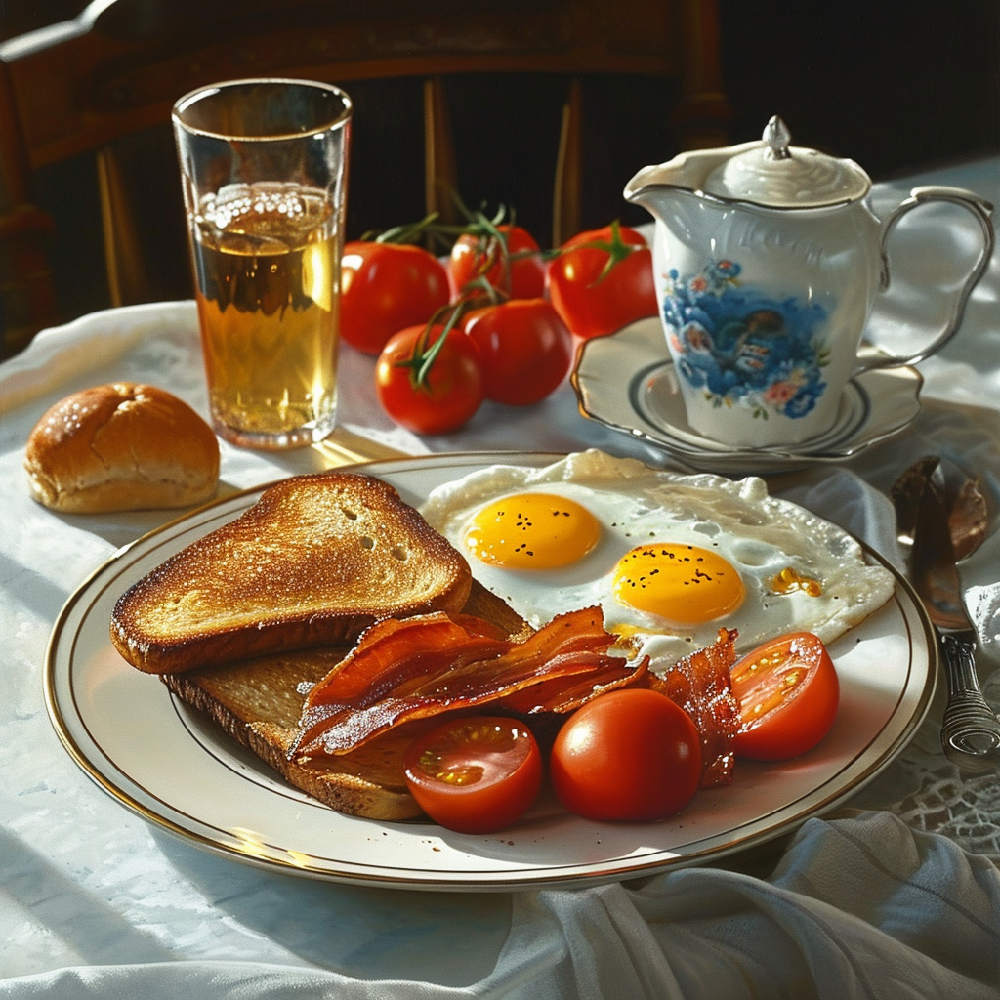

In [9]:
img = Image.open('sources/desayuno.png')
img

In [49]:
"""from IPython.display import Image as IPImage
   # Convierte la imagen a un objeto IPython.display.Image
   img_ipython = IPImage(img)
   # Luego pasa el objeto a la función
   response = model_vision.generate_content(img_ipython)"""

'from IPython.display import Image as IPImage\n   # Convierte la imagen a un objeto IPython.display.Image\n   img_ipython = IPImage(img)\n   # Luego pasa el objeto a la función\n   response = model_vision.generate_content(img_ipython)'

In [11]:
response = model_vision.generate_content(img)
to_markdown(response.text)

> Here are the bounding box detections:
> ```json
> [
>   {"box_2d": [448, 422, 675, 897], "label": "eggs"},
>   {"box_2d": [721, 401, 830, 541], "label": "tomato"},
>   {"box_2d": [687, 551, 823, 701], "label": "tomato"},
>   {"box_2d": [626, 680, 764, 841], "label": "tomato"},
>   {"box_2d": [226, 544, 341, 657], "label": "tomato"},
>   {"box_2d": [322, 374, 434, 482], "label": "tomato"},
>   {"box_2d": [219, 446, 309, 544], "label": "tomato"},
>   {"box_2d": [241, 338, 355, 450], "label": "tomato"},
>   {"box_2d": [491, 468, 574, 593], "label": "egg yolk"},
>   {"box_2d": [380, 22, 514, 219], "label": "bread roll"},
>   {"box_2d": [539, 611, 621, 744], "label": "egg yolk"},
>   {"box_2d": [296, 460, 405, 568], "label": "tomato"},
>   {"box_2d": [471, 110, 677, 472], "label": "toast"}
> ]
> ```

In [13]:
response = model_vision.generate_content(["Cuántas calorías tiene este plato aproximadamente? Podrías adicionar jamón?", img]) # "Que es lo que mas te gusta de este plato?, solo escoje una cosa y dime porque"
response.resolve()
to_markdown(response.text)

> Por supuesto, estimemos las calorías en ese plato, y luego agreguemos jamón.
> 
> **Estimación de calorías:**
> 
> *   **Huevos fritos (2):** Aproximadamente 140 calorías cada uno, suman 280 calorías.
> *   **Tocino:** 3 rebanadas de tocino representan alrededor de 150-200 calorías.
> *   **Tostadas (2 rebanadas):** Dependiendo del tipo de pan y si están untadas con mantequilla, podríamos estimar alrededor de 200-300 calorías.
> *   **Tomates (cortados):** Estos son bajos en calorías, alrededor de 20 calorías en total.
> *   **Pan:** aproximadamente 100-150 calorías.
> *   **Jugo de manzana:** aproximadamente 100-150 calorías.
> 
> **Total Estimado:** Sumando todo, el plato tiene aproximadamente **850 - 1100 calorías**.
> 
> **Agregando jamón:**
> 
> Si agregamos un par de rebanadas de jamón (unos 50 gramos), podemos estimar unas 70-100 calorías adicionales.
> 
> **Total con Jamón:** El plato con jamón tendría alrededor de **920 - 1200 calorías**.
> 
> Ten en cuenta que estas son solo estimaciones. El tamaño de las porciones, los ingredientes específicos y los métodos de cocción pueden influir en el contenido calórico final.

In [ ]:
response = model_vision.generate_content(["Podrías sacarme el valor proteico?", img]) 
response.resolve()
to_markdown(response.text)

> Calculando el valor proteico de los alimentos en la imagen:
> 
> *   **Huevos:** Dos huevos grandes aportan aproximadamente 12-14 gramos de proteína.
> *   **Tocino:** Aproximadamente 4 lonchas de tocino tienen alrededor de 8-10 gramos de proteína.
> *   **Pan:** Dos rebanadas de pan (asumiendo pan de trigo integral o similar) ofrecen unos 4-6 gramos de proteína.
> 
> **Estimación Total:**
> 
> Sumando las estimaciones individuales, el valor proteico total de los alimentos en la imagen sería aproximadamente:
> 
> 12 (huevos) + 8 (tocino) + 4 (pan) = **24 gramos**
> 14 (huevos) + 10 (tocino) + 6 (pan) = **30 gramos**
> 
> **Rango Estimado:** Entre 24 y 30 gramos de proteína.
> 
> **Es importante tener en cuenta:**
> 
> *   Estas son estimaciones aproximadas. El contenido proteico exacto puede variar según el tamaño específico de los huevos, el tipo y la cantidad de tocino, el tipo de pan y las marcas específicas de los alimentos.
> *   Esta estimación no incluye la pequeña cantidad de proteína que podrían aportar los tomates, el panecillo o la bebida en el vaso.

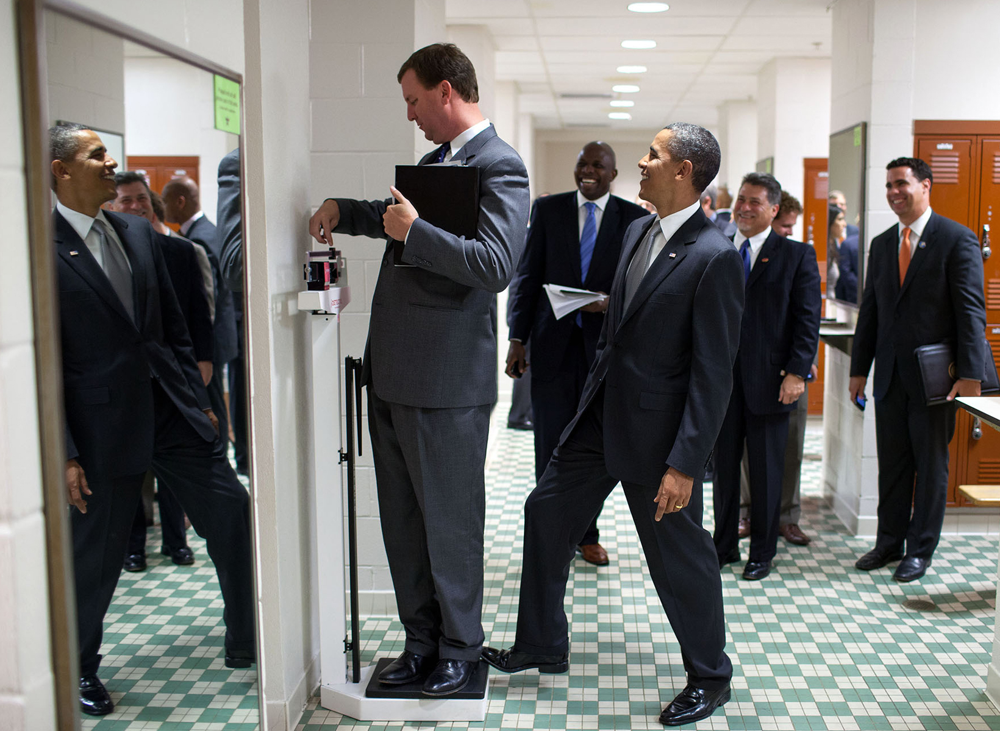

In [15]:
img = Image.open('Sources/obama.png')
img

In [16]:
response = model_vision.generate_content(["quienes estan aca y que esta pasando, porque es gracioso?", img])
response.resolve()
to_markdown(response.text)

> En la imagen, vemos al ex presidente Barack Obama y a varios hombres vestidos con trajes en lo que parece ser un pasillo. Un hombre está usando una báscula para medir su altura. Obama parece estar observando con una expresión divertida.
> 
> La razón por la que podría considerarse gracioso es la naturaleza mundana y rutinaria de usar una báscula para medir la altura, especialmente en contraste con la estatura y la seriedad que a menudo se asocian con un ex presidente. También puede ser que Obama esté haciendo alguna broma sobre la altura del hombre o la propia báscula.

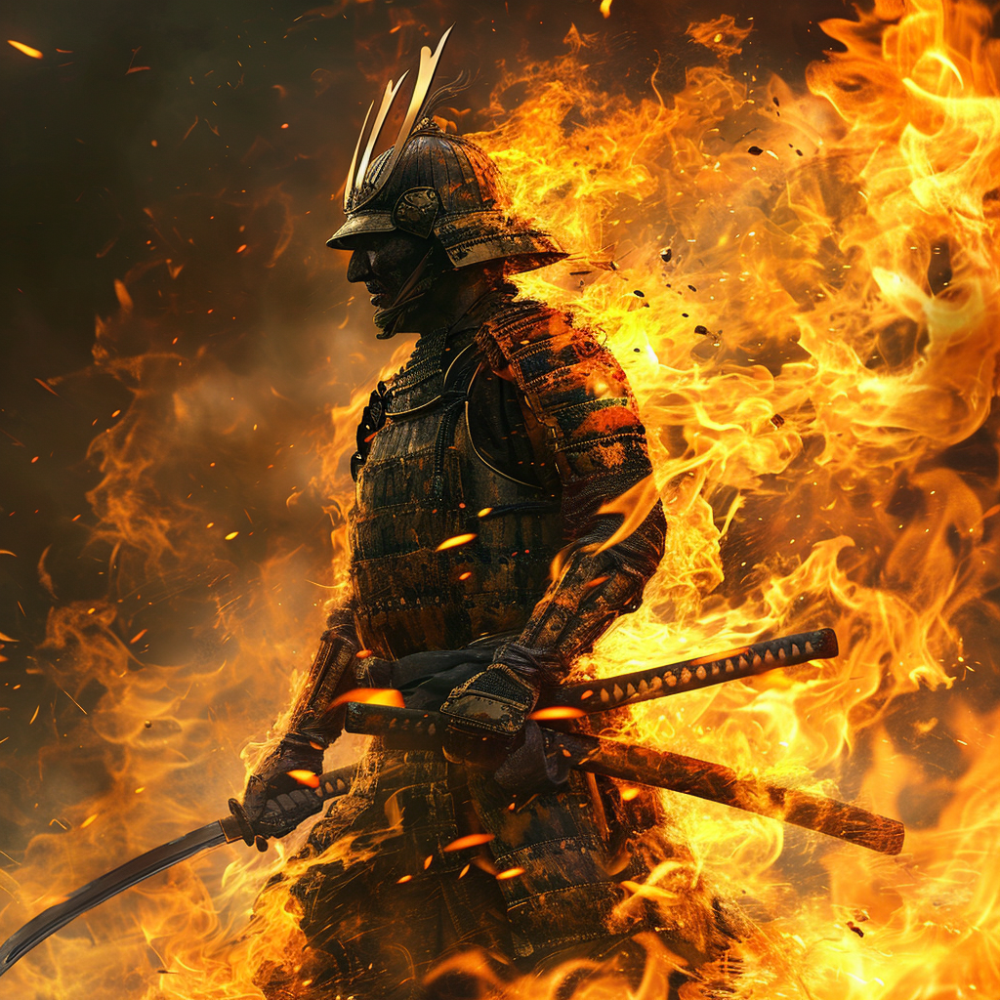

In [17]:
img = Image.open('Sources/fire_samurai.png')
img

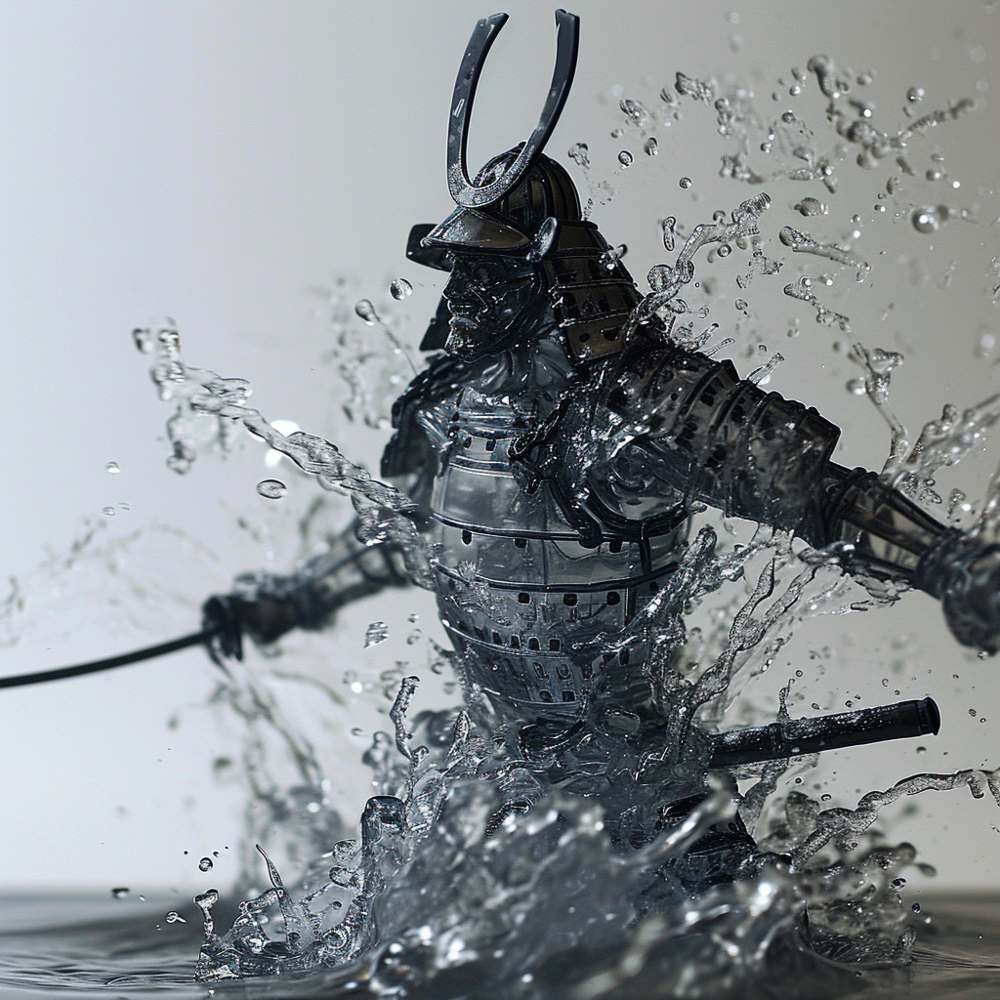

In [18]:
img_2 = Image.open('Sources/water_samurai.png')
img_2

In [19]:
response = model_vision.generate_content([img, img_2, "Crea una historia inspirada en estas dos imagenes, son distintos personajes"])
response.resolve()
to_markdown(response.text)

> Absolutamente. Aquí tienes una historia inspirada en esas dos imágenes, explorando cómo podrían ser personajes contrastantes pero complementarios:
> 
> **Título: "El Fuego y la Corriente"**
> 
> **Prólogo:**
> 
> En un Japón antiguo, bañado en leyendas y marcado por la guerra, dos figuras se alzaron como manifestaciones de fuerzas elementales. Kaito, conocido como el "Samurái de las Llamas", era un guerrero cuya furia ardía como el infierno. Sus movimientos eran rápidos y destructivos, su espada envuelta en un calor que derretía las armaduras. Opuesto a él estaba Mizuki, la "Samurái del Agua", una guerrera cuya calma era tan profunda como los océanos. Sus habilidades eran fluidas y evasivas, su katana danzaba como la corriente, desviando y cortando con precisión quirúrgica.
> 
> **Capítulo 1: El Asedio de la Fortaleza del Fuego**
> 
> Kaito lideraba sus fuerzas en un asedio implacable contra la fortaleza del clan enemigo. El fuego de su ejército consumía las defensas, y su propia ira era la punta de lanza del ataque. Sin embargo, su brutalidad era tan peligrosa para sus aliados como para sus enemigos. Incapaz de ver más allá de la destrucción inmediata, Kaito cayó en una trampa, quedando aislado en el corazón de la fortaleza en llamas.
> 
> **Capítulo 2: La Infiltración Silenciosa**
> 
> Mizuki fue enviada por el shogun para observar y, si era necesario, contener a Kaito. Ella vio la imprudencia de su ataque y la forma en que su ira ciega estaba a punto de llevar a su clan a la ruina. En lugar de enfrentarlo directamente, Mizuki usó su dominio del agua para infiltrarse silenciosamente en la fortaleza. Navegó a través de las llamas, usando su habilidad para manipular la humedad y crear pasajes seguros donde el fuego no podía tocarla.
> 
> **Capítulo 3: El Encuentro Elemental**
> 
> Cuando Mizuki encontró a Kaito, él estaba rodeado de enemigos, su armadura ennegrecida y su espíritu al borde de la desesperación. En lugar de juzgarlo, ella le ofreció una salida. "Tu fuego es poderoso, Kaito", dijo, "pero sin control, te consumirá a ti mismo y a todo lo que amas".
> 
> Kaito la miró con incredulidad, su furia aún ardiendo pero ahora mezclada con un toque de confusión. ¿Quién era esta mujer que podía moverse libremente en el infierno que él había desatado?
> 
> **Capítulo 4: El Baile de la Destrucción y la Preservación**
> 
> Mizuki y Kaito lucharon juntos, una danza de destrucción y preservación. Kaito arrasaba con sus llamas, mientras Mizuki apagaba los incendios descontrolados y protegía a los aliados atrapados en el fuego cruzado. Ella le mostró cómo usar su poder con precisión, cómo enfocar su ira en objetivos específicos en lugar de dejar que consumiera todo a su paso.
> 
> **Capítulo 5: La Lección del Agua**
> 
> Finalmente, lograron romper el asedio y asegurar la victoria, pero no sin un costo. Kaito, agotado y humillado, se dio cuenta del precio de su furia descontrolada. Mizuki le enseñó a canalizar su ira, a encontrar la calma en medio del caos, a ser como el agua: capaz de erosionar la roca más dura, pero también de fluir alrededor de los obstáculos y nutrir la vida.
> 
> **Epílogo:**
> 
> Kaito y Mizuki se convirtieron en aliados improbables, cada uno aprendiendo del otro. Kaito aprendió a controlar su fuego, convirtiéndose en un guerrero más estratégico y compasivo. Mizuki encontró en Kaito una pasión que ella había reprimido, una voluntad de luchar por lo que creía, incluso cuando el camino era peligroso. Juntos, se convirtieron en un símbolo de equilibrio y armonía, demostrando que incluso las fuerzas más opuestas pueden unirse para crear algo más grande y poderoso.